In [31]:
import h5py
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.optimizers import RMSprop,Adam
from tensorflow.keras.callbacks import ModelCheckpoint,EarlyStopping,ReduceLROnPlateau,CSVLogger
from tensorflow.keras.models import load_model
import matplotlib.pyplot as plt
import time,glob
from model import all_model
from utils import *

In [32]:
## 加载数据集，数据集维度为3840×3840×4，最后一个波段是真值标签，标签一共有六类，“”
hdf5_path = "./data/kaggle_14_8b_5c.hdf5"
fd = h5py.File(hdf5_path, 'r')
fd.keys()
images=fd['image']
labels=fd['label']
n_label=len(np.unique(labels)) #{0:'buiding',1:'Road', 2:'Tree',3: 'Crops',4:'Water'}
## 该影像是反射率数据（通常数值在0-1之间），为了节省存储空间常将数值放大10000倍，保存为无符号整型数据
print(np.max(images),np.min(images),np.max(labels),np.min(labels))
images=np.array(images)
labels=np.array(labels)
print(images.shape,labels.shape)


9995 38 4 0
(14, 3840, 3840, 7) (14, 3840, 3840)


In [33]:
## 将整幅影像及标签数据打印出来,为了提升原始影像的显示效果，对原有数据进行拉伸处理 

def stretch_n(band, lower_percent=5, higher_percent=95): #5和95表示分位数
    band=np.array(band,dtype=np.float32)
    c = np.percentile(band, lower_percent)*1.0
    d = np.percentile(band, higher_percent)*1.0       
    band[band<c] = c
    band[band>d] = d
    out =  (band - c)  / (d - c)  
    return out.astype(np.float32)

def adjust_contrast(data,n_band=3):    #通过循环对各个波段进行拉伸
    data=np.array(data,dtype=np.float32)
    for img in data:
        for k in range(n_band):
            img[:,:,k] = stretch_n(img[:,:,k])
    return data

newimg=adjust_contrast(images.copy(),n_band=images.shape[-1]) #该操作讲改变原始数据，因此用.copy，不对原始数据进行更改
print(np.max(images),np.max(newimg))
# show_5_images(images/10000,labels)#plot函数要求数据为0-1之间的浮点型或0-255的8位整型数据
# show_5_images(newimg,labels)



9995 1.0


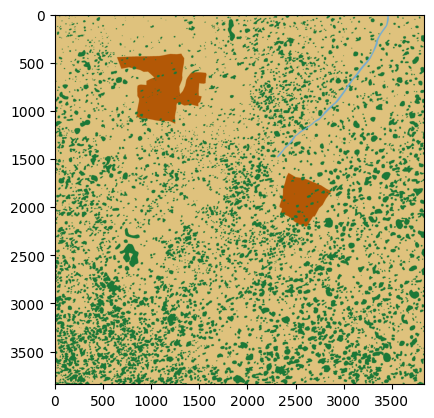

0


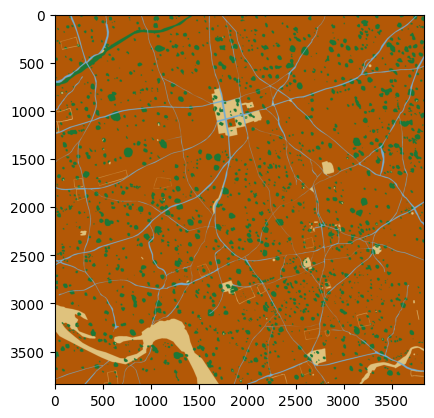

1


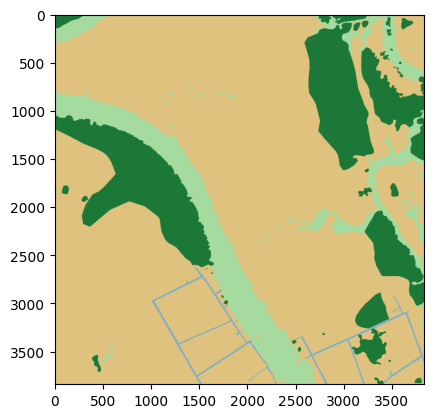

2


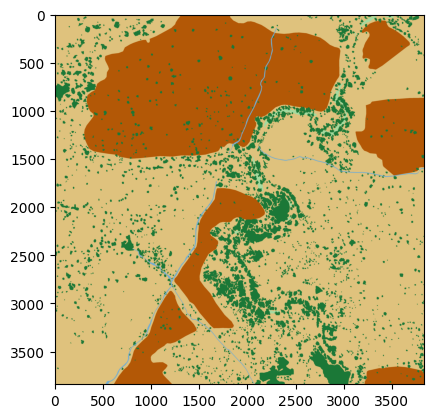

3


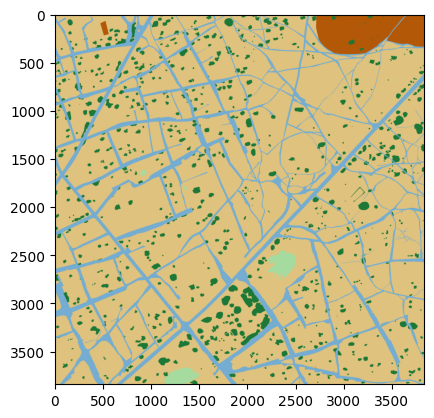

4


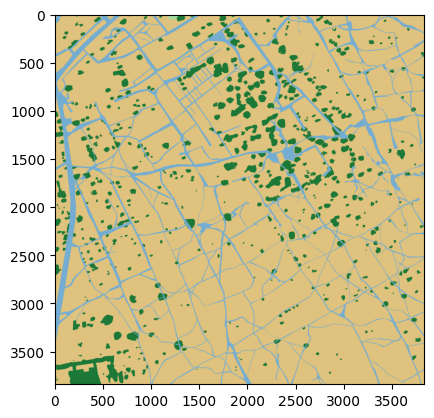

5


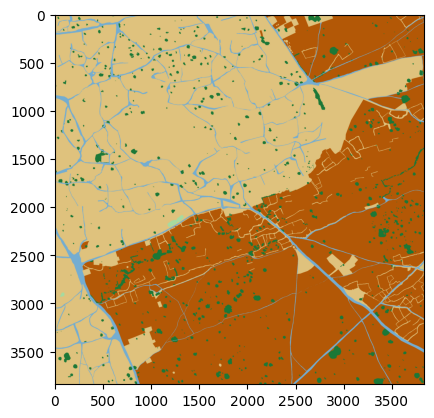

6


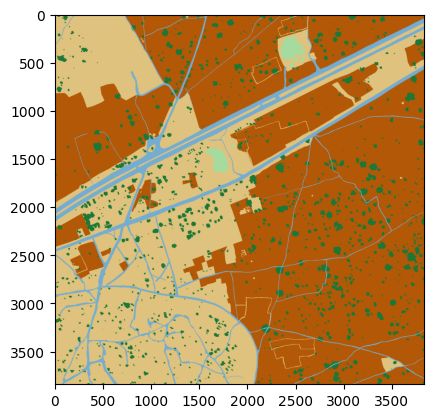

7


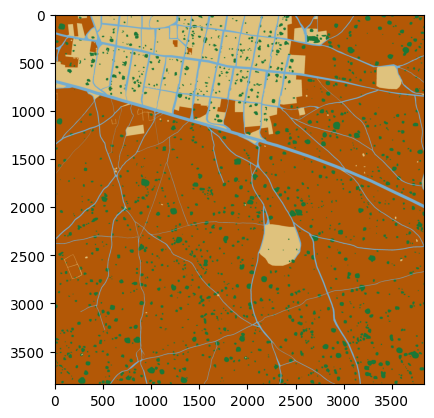

8


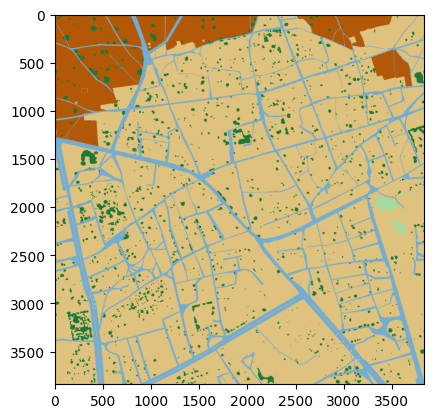

9


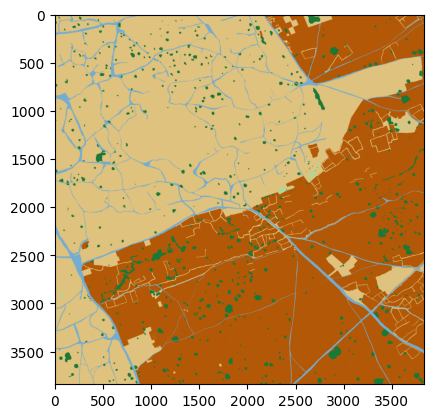

10


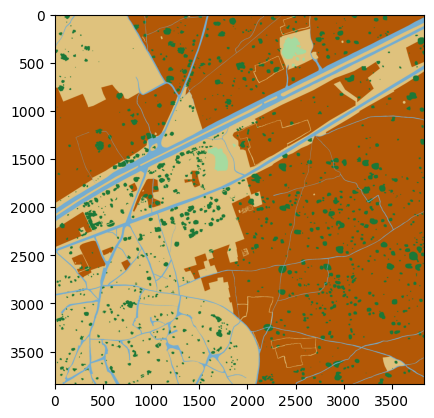

11


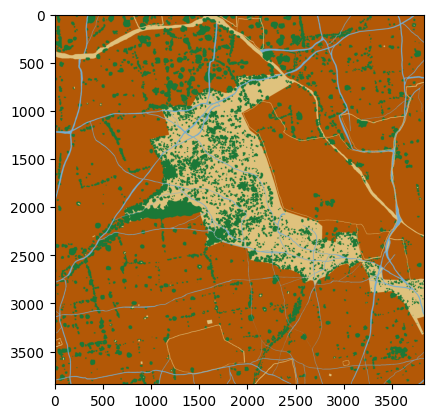

12


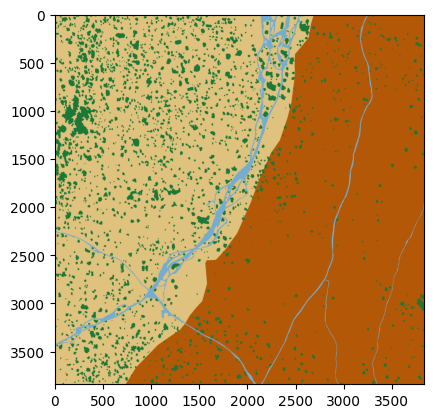

13


In [34]:
palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
color=palette[labels]
for i in range(newimg.shape[0]):
    plt.imshow(color[i,:,:])    
    plt.show()
    print(i)

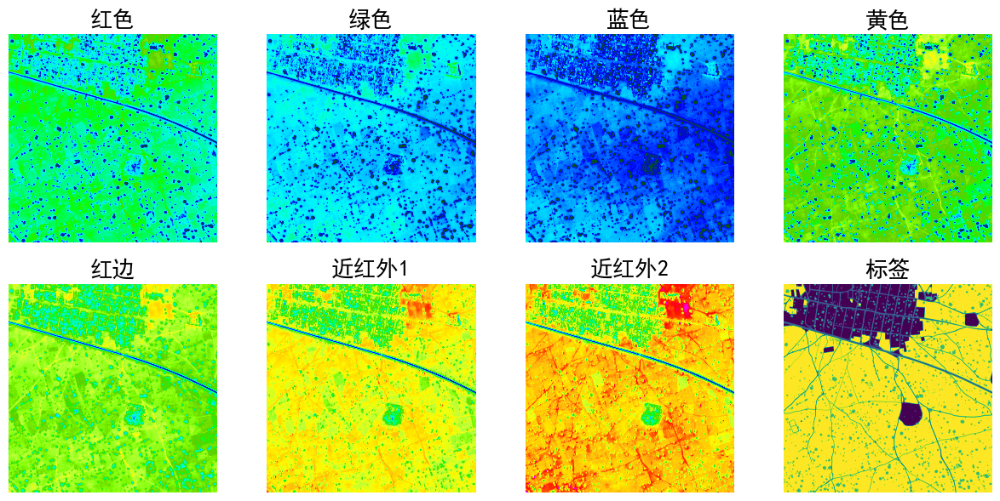

In [23]:
def Plot_Image_Allband(img,label):  
    plt.figure(figsize=[15,7])
    name_list = ['红色','绿色','蓝色','黄色','红边','近红外1','近红外2']
    for i in range(1,8):
        plt.subplot(2,4,i)
        plt.rcParams['font.sans-serif']=['SimHei']    # 用来设置字体样式以正常显示中文标签
        plt.rc('font',family='SimHei',size=16)
        plt.imshow(img[:, :, i-1],cmap=plt.get_cmap('gist_ncar'))
        plt.title(name_list[i-1])
        plt.axis('off')
    plt.subplot(2,4,8)
    plt.imshow(label)
    plt.title('标签')
    plt.axis('off')
    plt.show() 
Plot_Image_Allband(images[8,:,:,:],labels[8,:,:])

In [31]:
hdf5_path = "./data/patches_mul_8b_5c.hdf5"
fd = h5py.File(hdf5_path, 'r')
fd.keys()
images=np.array(fd['image'])
labels=np.array(fd['label'])#3:tree,4:road,5:crop

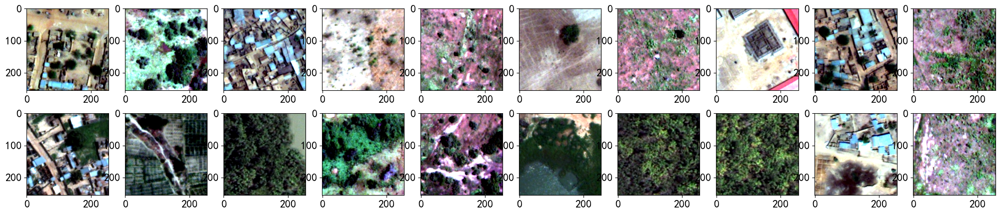

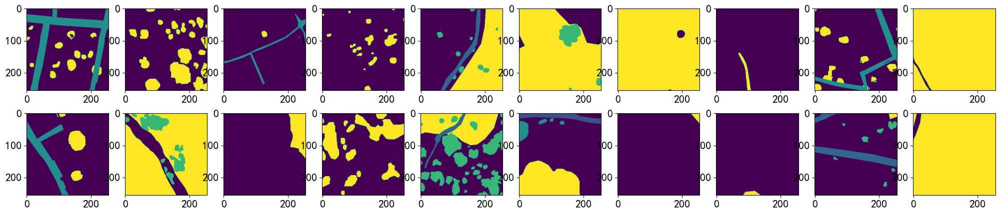

In [33]:
##调用utils中的plot_func查看数据与label是否对应,反复运行这个cell进行数据浏览i表示每次浏览跨越数据的个数
plot_func(images[i:i+20,:,:,:3],labels[i:i+20:,:,:])
i+=500

In [34]:
## 对数据进行归一化处理，并将label转成one-hot标签形式
# n_label=5
def post_normalize_image(images,labels,n_label=n_label):
    msk = label_hot(labels,n_label)
    img = images
    return img,msk
img,msk=post_normalize_image(images,labels,n_label)
# img,msk=post_normalize_image(all_patches[:,:,:,0:-1],all_patches[:,:,:,-1],n_label)
## 将数据集按照7:3进行划分
xtrain,xtest,ytrain,ytest=train_test_split(img,msk,test_size=0.2,random_state=42)
del img,msk #如果数据较大可以在此删除降低内存
print(xtrain.shape,xtest.shape,ytrain.shape,ytest.shape)
i=0

(2195, 256, 256, 7) (549, 256, 256, 7) (2195, 256, 256, 5) (549, 256, 256, 5)


### 4. 评价测试

In [5]:
## 采用带有权重的交叉熵损失函数
from keras import backend as K
import tensorflow as tf
def weighted_categorical_crossentropy(weights):
    """
    Usage:
        weights = np.array([0.5,2,10]) # Class one at 0.5, class 2 twice the normal weights, class 3 10x.
        loss = weighted_categorical_crossentropy(weights)
    """
    weights = K.variable(weights)
    def loss(y_true, y_pred):
        # scale predictions so that the class probas of each sample sum to 1
        y_pred /= K.sum(y_pred, axis=-1, keepdims=True)
        # clip to prevent NaN's and Inf's
        y_pred = K.clip(y_pred, K.epsilon(), 1 - K.epsilon())
        # calc
        loss = y_true * K.log(y_pred) * weights
        loss = -K.sum(loss, -1)
        return loss
    return loss

In [35]:
## 训练过程只保留最有性能参数文件，因此从训练记录里选择最后一个即可
modelname='unet'
h5=glob.glob("./checkpoint/"+modelname+"/*.hdf5")
model_list=np.sort(h5)
model_unet=load_model(model_list[-1])
# model=load_model(model_list[-1],custom_objects={'interpolation':interpolation})#keras导入模型需要判断是会否有自定义函数或层，有的话需要在custom_objects中定义，并编译
print(model_list[-1])

./checkpoint/unet\-24e-val_loss0.424916.hdf5


In [36]:
## 训练过程只保留最有性能参数文件，因此从训练记录里选择最后一个即可
modelname='unet_model'
h5=glob.glob("./checkpoint/"+modelname+"/*.hdf5")
model_list=np.sort(h5)
# model_unet_model=load_model(model_list[-1])
model_unet_model=model=load_model(model_list[-1],custom_objects={'loss':weighted_categorical_crossentropy}) 
print(model_list[-1])

./checkpoint/unet_model\unet_model-44e-val_loss0.472270.hdf5


In [37]:
## 训练过程只保留最有性能参数文件，因此从训练记录里选择最后一个即可
modelname='unet_model2'
h5=glob.glob("./checkpoint/"+modelname+"/*.hdf5")
model_list=np.sort(h5)
# model_unet_model=load_model(model_list[-1])
model_unet_model2=model=load_model(model_list[-1],custom_objects={'loss':weighted_categorical_crossentropy}) 
print(model_list[-1])

./checkpoint/unet_model2\unet_model2-29e-val_loss0.310983.hdf5


In [38]:
## 训练过程只保留最有性能参数文件，因此从训练记录里选择最后一个即可
modelname='unet_multi'
h5=glob.glob("./checkpoint/"+modelname+"/*.hdf5")
model_list=np.sort(h5)
# model_unet_model=load_model(model_list[-1])
model_unet_multi=model=load_model(model_list[-1],custom_objects={'loss':weighted_categorical_crossentropy}) 
print(model_list[-1])

./checkpoint/unet_multi\unet_multi-32e-val_loss0.422448.hdf5


In [39]:
## 训练过程只保留最有性能参数文件，因此从训练记录里选择最后一个即可
modelname='convattunet'
h5=glob.glob("./checkpoint/"+modelname+"/*.hdf5")
model_list=np.sort(h5)
# model_unet_model=load_model(model_list[-1])
model_convattunet=model=load_model(model_list[-1],custom_objects={'loss':weighted_categorical_crossentropy}) 
print(model_list[-1])

./checkpoint/convattunet\-45e-val_loss0.317361.hdf5


In [40]:
## 训练过程只保留最有性能参数文件，因此从训练记录里选择最后一个即可
modelname='convattunet_multi'
h5=glob.glob("./checkpoint/"+modelname+"/*.hdf5")
model_list=np.sort(h5)
# model_unet_model=load_model(model_list[-1])
model_convattunet_multi=model=load_model(model_list[-1],custom_objects={'loss':weighted_categorical_crossentropy}) 
print(model_list[-1])

./checkpoint/convattunet_multi\convattunet_multi-44e-val_loss0.281526.hdf5


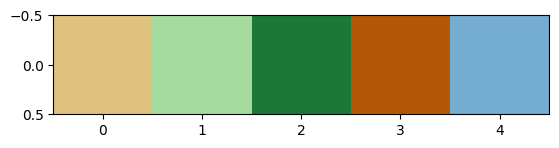

In [41]:
palette = np.array([ [223,194,125],  [166,219,160],   [27,120,55], [179,88,6], [116,173,209] ]) 
I = np.array([[0,1,2,3,4]])
rgb=palette[I]
plt.imshow(rgb)

In [391]:
# 首先对切片数据进行预测，查看效果
# i=0
# pred=model_convattunet_multi.predict(xtrain,batch_size=64)
# pred=np.argmax(pred,axis=-1)
# gt=np.argmax(ytrain,axis=-1)

# palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
# predc=palette[pred]
# gtc=palette[gt]

# val_plot_func(xtrain[i:i+20],gtc[i:i+20],predc[i:i+20])
# i+=100
# i


In [377]:
# data=[]
# lab=[]
# number=[]
n=2108
number.append(n)
k=xtrain[n,:,:,:]
j=ytrain[n,:,:,:]
data.append(k)
lab.append(j)

2000


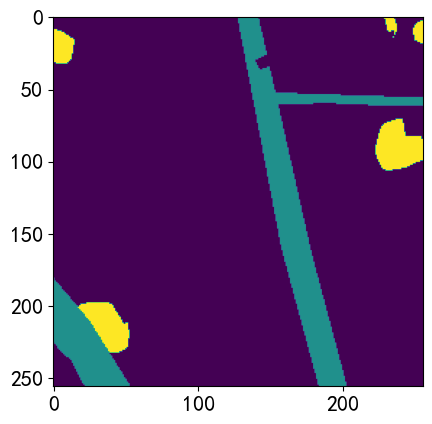

In [370]:
print(i)
plt.imshow(gt[1907,:,:])

In [379]:
data=np.asarray(data)
lab=np.asarray(lab)

data.shape,lab.shape

((43, 256, 256, 7), (43, 256, 256, 5))

In [380]:
gtn=np.argmax(lab,axis=-1)

In [381]:
newdata=np.concatenate((data,np.expand_dims(gtn,axis=-1)),axis=-1)
np.save('./testdata.npy',newdata)

In [9]:
newdata=np.load('./testdata.npy')

In [10]:
def val_plot(data,label,pred):
    fig=plt.figure(figsize=(25,5))
    for i in range(20):
        plt.subplot(2,10,i+1)
        plt.imshow(data[i,:,:,:3])
        plt.axis('off')
    plt.show()
    fig=plt.figure(figsize=(25,5))
    for i in range(20):
        plt.subplot(2,10,i+1)
        plt.imshow(label[i,:,:])
        plt.axis('off')
    plt.show()
    fig=plt.figure(figsize=(25,5))
    for i in range(20):
        plt.subplot(2,10,i+1)
        plt.imshow(pred[i,:,:])
        plt.axis('off')
    plt.show()
def new_val_plot(data,label,pred):
    fig=plt.figure(figsize=(25,5))
    for i in range(8):
        plt.subplot(1,8,i+1)
        plt.imshow(data[i,:,:,:3])
        plt.axis('off')
    plt.show()
    fig=plt.figure(figsize=(25,5))
    for i in range(8):
        plt.subplot(1,8,i+1)
        plt.imshow(label[i,:,:])
        plt.axis('off')
    plt.show()
    fig=plt.figure(figsize=(25,5))
    for i in range(8):
        plt.subplot(1,8,i+1)
        plt.imshow(pred[i,:,:])
        plt.axis('off')
    plt.show()

In [11]:
index=[3,5,7,10,18,27,28,32]
testdata=newdata[index]
# np.save('./final_testdata.npy',testdata)
# newdata.shape

In [428]:
# i=20
# val_plot(newdata[i:i+20],gtc[i:i+20],predc[i:i+20])

1/1 [==============================] - 0s 277ms/step


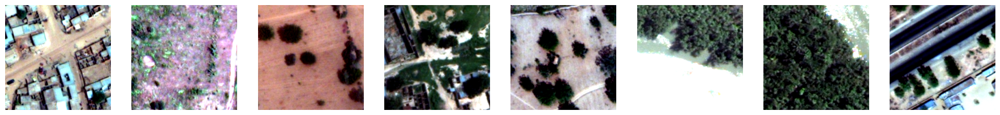

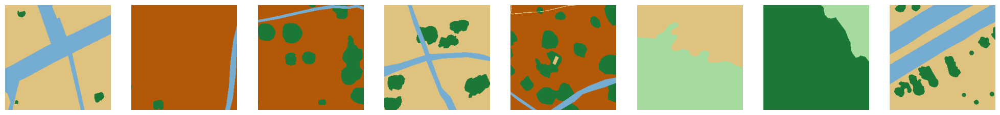

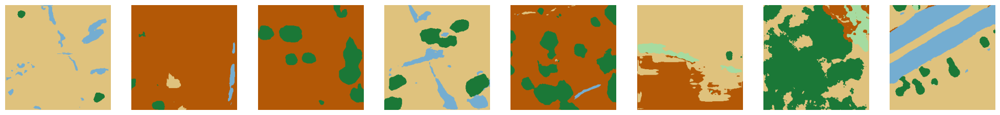

In [436]:
pred=model_unet.predict(testdata[:,:,:,:3],batch_size=64)
pred=np.argmax(pred,axis=-1)
gt=np.array(testdata[:,:,:,-1],dtype=np.uint8)

palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
predc=palette[pred]
gtc=palette[gt]

new_val_plot(testdata,gtc,predc)

1/1 [==============================] - 1s 674ms/step


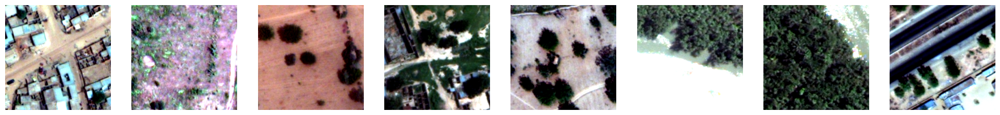

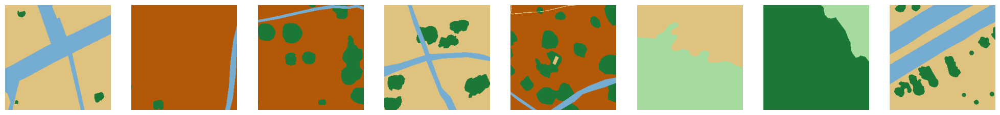

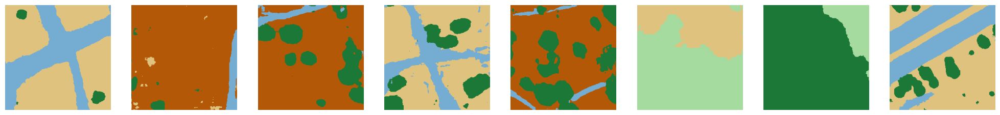

In [437]:
pred=model_convattunet.predict(testdata[:,:,:,:3],batch_size=64)
pred=np.argmax(pred,axis=-1)
gt=np.array(testdata[:,:,:,-1],dtype=np.uint8)

palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
predc=palette[pred]
gtc=palette[gt]

new_val_plot(testdata,gtc,predc)

1/1 [==============================] - 3s 3s/step


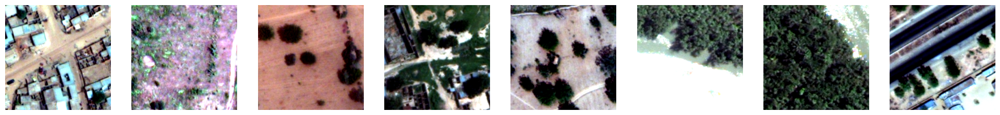

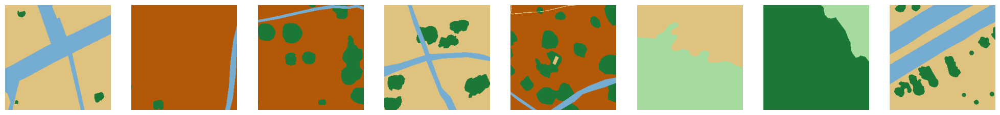

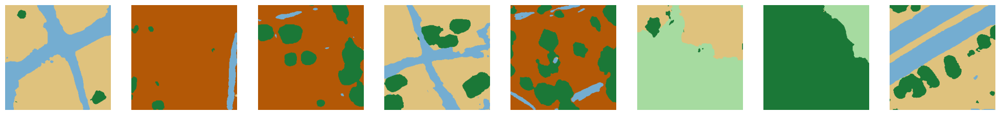

In [12]:
pred=model_unet_model2.predict(testdata[:,:,:,:-1],batch_size=64)
pred=np.argmax(pred,axis=-1)
gt=np.array(testdata[:,:,:,-1],dtype=np.uint8)

palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
predc=palette[pred]
gtc=palette[gt]

new_val_plot(testdata,gtc,predc)

1/1 [==============================] - 1s 1s/step


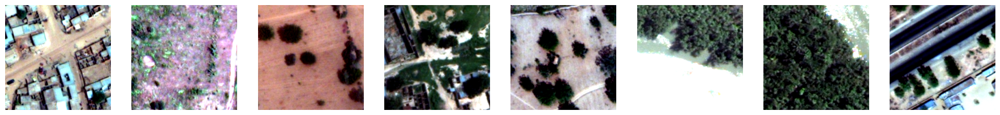

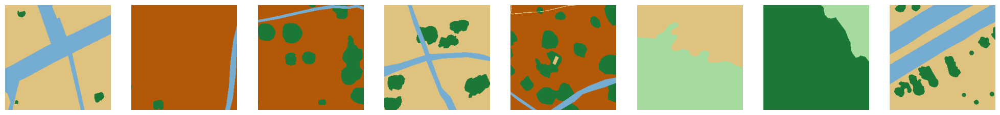

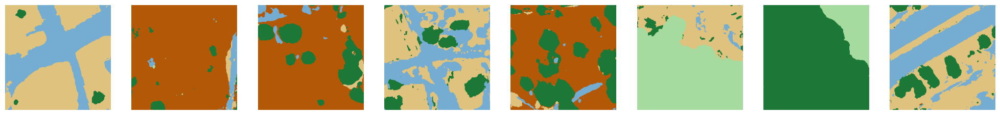

In [434]:
pred=model_unet_model.predict(testdata[:,:,:,:-1],batch_size=64)
pred=np.argmax(pred,axis=-1)
gt=np.array(testdata[:,:,:,-1],dtype=np.uint8)

palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
predc=palette[pred]
gtc=palette[gt]

new_val_plot(testdata,gtc,predc)

1/1 [==============================] - 0s 270ms/step


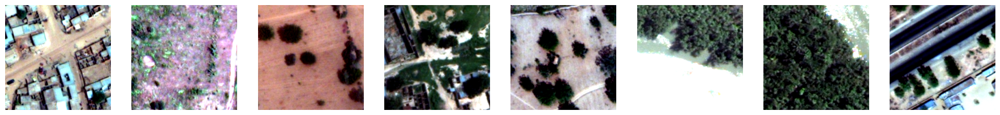

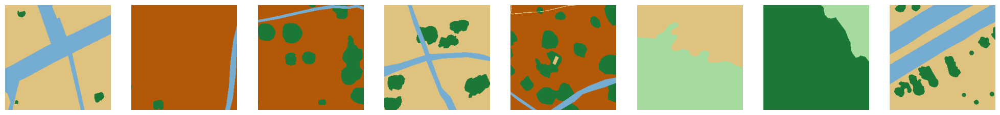

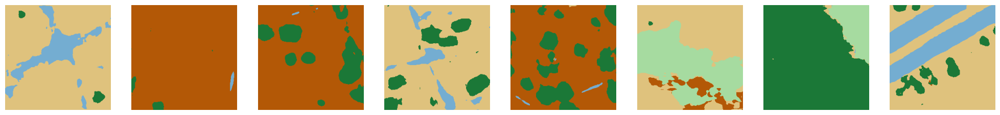

In [435]:
pred=model_unet_multi.predict(testdata[:,:,:,:-1],batch_size=64)
pred=np.argmax(pred,axis=-1)
gt=np.array(testdata[:,:,:,-1],dtype=np.uint8)

palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
predc=palette[pred]
gtc=palette[gt]

new_val_plot(testdata,gtc,predc)

1/1 [==============================] - 1s 790ms/step


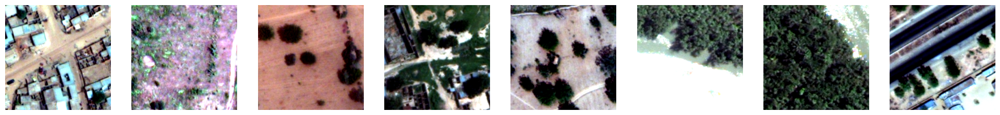

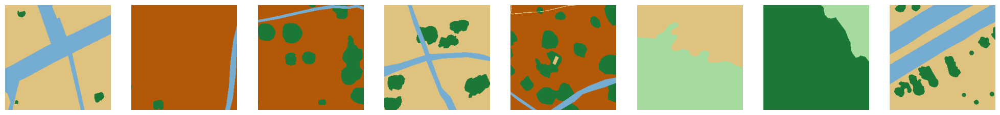

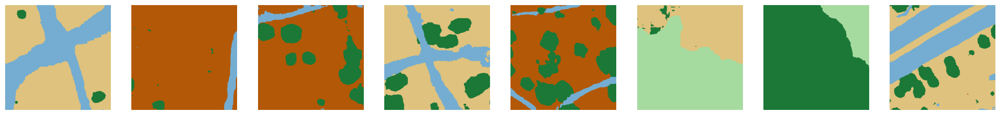

In [431]:
pred=model_convattunet_multi.predict(testdata[:,:,:,:-1],batch_size=64)
pred=np.argmax(pred,axis=-1)
gt=np.array(testdata[:,:,:,-1],dtype=np.uint8)

palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
predc=palette[pred]
gtc=palette[gt]

new_val_plot(testdata,gtc,predc)

[88277425, 9855151, 15246138, 64812607, 1639463]


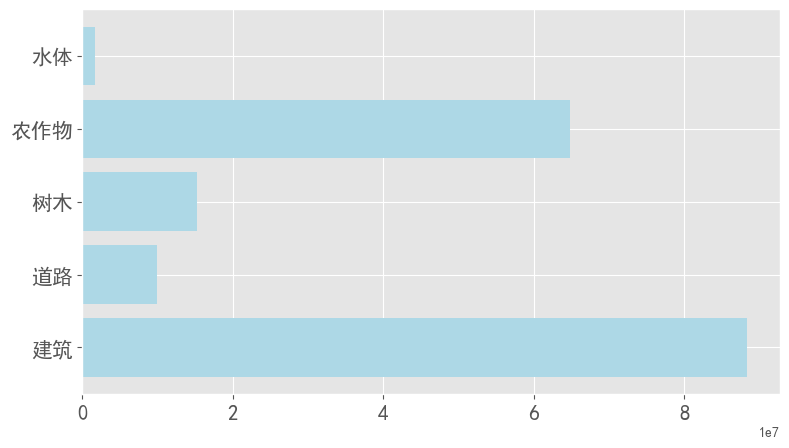

In [390]:
build_num = np.sum(labels ==0)
road_num = np.sum(labels == 1)
tree_num = np.sum(labels == 2)
crop_num = np.sum(labels == 3)
water_num = np.sum(labels == 4)
# 这两行代码解决 plt 中文显示的问题
fig=plt.figure(figsize=(9,5))
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False
plt.style.use("ggplot")
# classes = ('0-Building', '1-Road', '2-Tree', '3-Crop', '4-Riveer')

classes = ('建筑', '道路', '树木', '农作物', '水体')
numbers = [build_num,road_num, tree_num,crop_num, water_num]
print(numbers)
plt.barh(classes, numbers,color='lightblue')
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
# plt.title('各个遥感地类数据量分布情况')
# plt.savefig("Number-category.png", dpi = 600, bbox_inches="tight")
plt.show()

#### 4.3 整景影像的预测

In [454]:
## 加载整景的影像进行测试
# test_data  = h5py.File('./data/kaggle_test1_8b_5c.hdf5', 'r')
# testimg = np.array(test_data['image'])
# testlabel=np.array(test_data['label'])
# print(testimg.shape,testlabel.shape)


In [447]:
## 与训练数据采用相同的预处理方式
# image=adjust_contrast(testimg,n_band=testimg.shape[-1])
# np.max(image),np.max(testimg)

In [ ]:
# def stacking_mask(pred,index):
        

In [18]:
predicts=[]
for i in range(newimg.shape[0]):
    image=newimg[i,:,:,:7]
    testlabel=labels[i,:,:]
    h_pred = center_predict(image,model_unet_model2,32,n_label)
    h_pred_mask=np.argmax(h_pred, axis = -1)
    # print(h_pred.shape,testlabel.shape)
    palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
    predc=palette[h_pred_mask]
    predicts.append(predc)  
result=np.array(predicts)

31/31 [==============================] - 3s 88ms/step
pred_time: 7.099557638168335
31/31 [==============================] - 3s 87ms/step
pred_time: 7.042649030685425
31/31 [==============================] - 3s 94ms/step
pred_time: 7.223358631134033
31/31 [==============================] - 3s 87ms/step
pred_time: 7.011699676513672
31/31 [==============================] - 3s 87ms/step
pred_time: 7.083583354949951
31/31 [==============================] - 3s 87ms/step
pred_time: 7.075596332550049
31/31 [==============================] - 3s 87ms/step
pred_time: 7.068607568740845
31/31 [==============================] - 3s 88ms/step
pred_time: 7.070604562759399
31/31 [==============================] - 3s 87ms/step
pred_time: 7.040652275085449
31/31 [==============================] - 3s 87ms/step
pred_time: 7.075596332550049
31/31 [==============================] - 3s 87ms/step
pred_time: 7.023679494857788
31/31 [==============================] - 3s 87ms/step
pred_time: 7.684614658355713
31/3

In [19]:
gt=np.array(labels,dtype=np.uint8)
gtc=palette[gt]

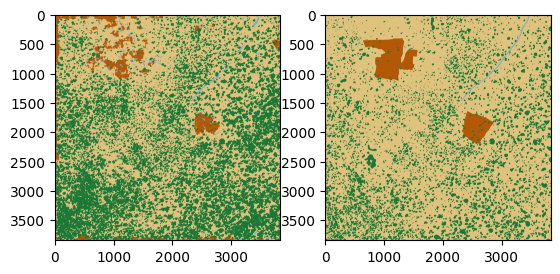

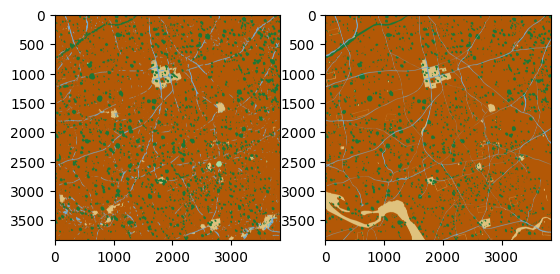

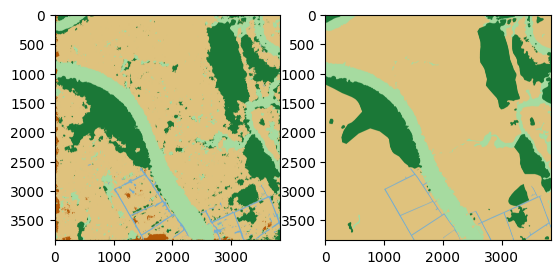

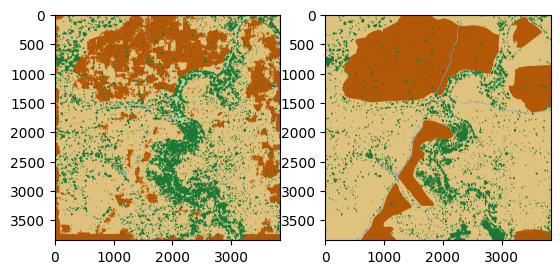

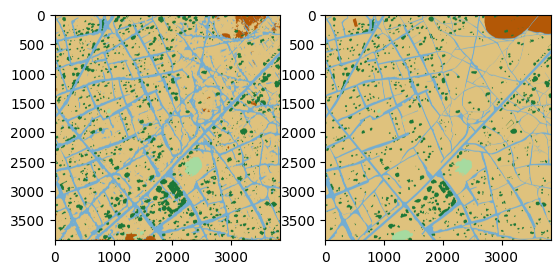

...

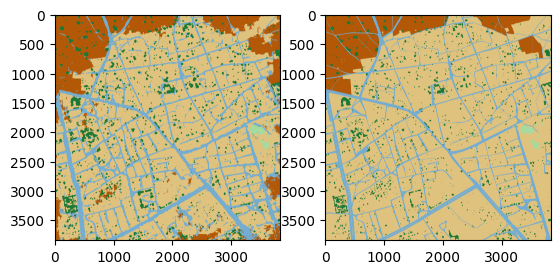

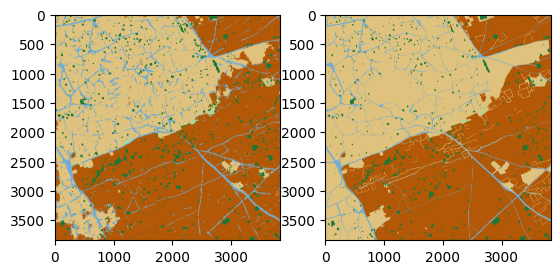

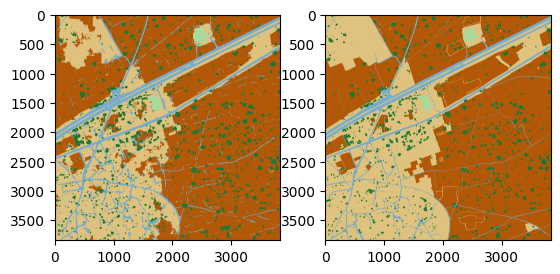

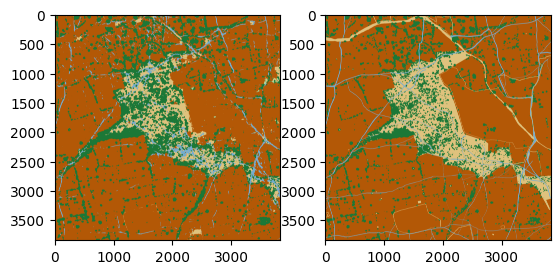

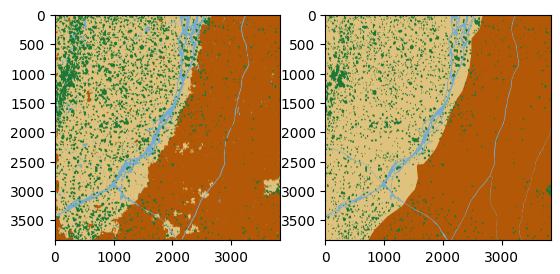

In [20]:
for i in range(result.shape[0]):
    plt.subplot(1,2,1)
    plt.imshow(result[i])
    plt.subplot(1,2,2)
    plt.imshow(gtc[i])
    plt.show()

In [42]:
## 首先对影像做padding，保证其能够被crop_size整除，先沿着行列分别裁切样本，再统一进行预测，预测后数据按照原来的顺序再排列组合复原。需要注意的是这里采用的是膨胀预测的方法，喂给模型用来预测的切片大小是256，但放的时候只保留了中间的128×128，四周数据可靠度低，直接废弃
def center_predict(img,model,batch_size,n_label,strides=128,img_size=256):
    corner_size=int(0.25*img_size)
    h,w,c = img.shape
    padding_h = (h//strides + 1) * strides+corner_size+corner_size
    padding_w = (w//strides + 1) * strides+corner_size+corner_size
    
    padding_img = np.zeros((padding_h,padding_w,c),dtype=np.float16)
    padding_img[corner_size:corner_size+h,corner_size:corner_size+w,:] = img[:,:,:]
    mask_whole = np.zeros((padding_h,padding_w,n_label),dtype=np.float16)
    crop_batch=[]
    for i in range(h//strides+1):
        for j in range(w//strides+1):
            crop_img = padding_img[i*strides:i*strides+img_size,j*strides:j*strides+img_size,:]
            ch,cw,c = crop_img.shape
            
            if ch != img_size or cw != img_size:
                continue
            crop_batch.append(crop_img)
            
    crop_batch=np.array(crop_batch)
    start_time=time.time()
    pred=model.predict(crop_batch,batch_size=batch_size)

    for i in range(h//strides+1):
        for j in range(w//strides+1):
            mask_whole[i*strides+corner_size:i*strides+img_size-corner_size,j*strides+corner_size:j*strides+img_size-corner_size] = pred[(i+1-1)*(w//strides+1)+(j+1)-1,corner_size:img_size-corner_size,corner_size:img_size-corner_size]
    score = mask_whole[corner_size:corner_size+h,corner_size:corner_size+w]
    end_time=time.time()
    print('pred_time:',end_time-start_time)
    return score

In [43]:
models=[model_unet,model_unet_multi,model_convattunet,model_unet_model2,model_convattunet_multi]
databand=[3,7,3,7,7]


In [44]:
predicts=[]
for i in range(5):
    image=newimg[7,:,:,:databand[i]]
    testlabel=labels[7,:,:]
    h_pred = center_predict(image,models[i],32,n_label)
    h_pred_mask=np.argmax(h_pred, axis = -1)
    # print(h_pred.shape,testlabel.shape)
    palette = np.array([ [223,194,125],   [116,173,209],   [27,120,55], [179,88,6], [166,219,160]]) 
    predc=palette[h_pred_mask]
    predicts.append(predc)  
result=np.array(predicts)

31/31 [==============================] - 3s 76ms/step
pred_time: 5.410280466079712
31/31 [==============================] - 3s 88ms/step
pred_time: 7.350163459777832
31/31 [==============================] - 9s 290ms/step
pred_time: 12.17637586593628
31/31 [==============================] - 3s 88ms/step
pred_time: 7.317207336425781
31/31 [==============================] - 10s 300ms/step
pred_time: 14.17715048789978


In [45]:
gt=np.array(testlabel,dtype=np.uint8)
gtc=palette[gt]

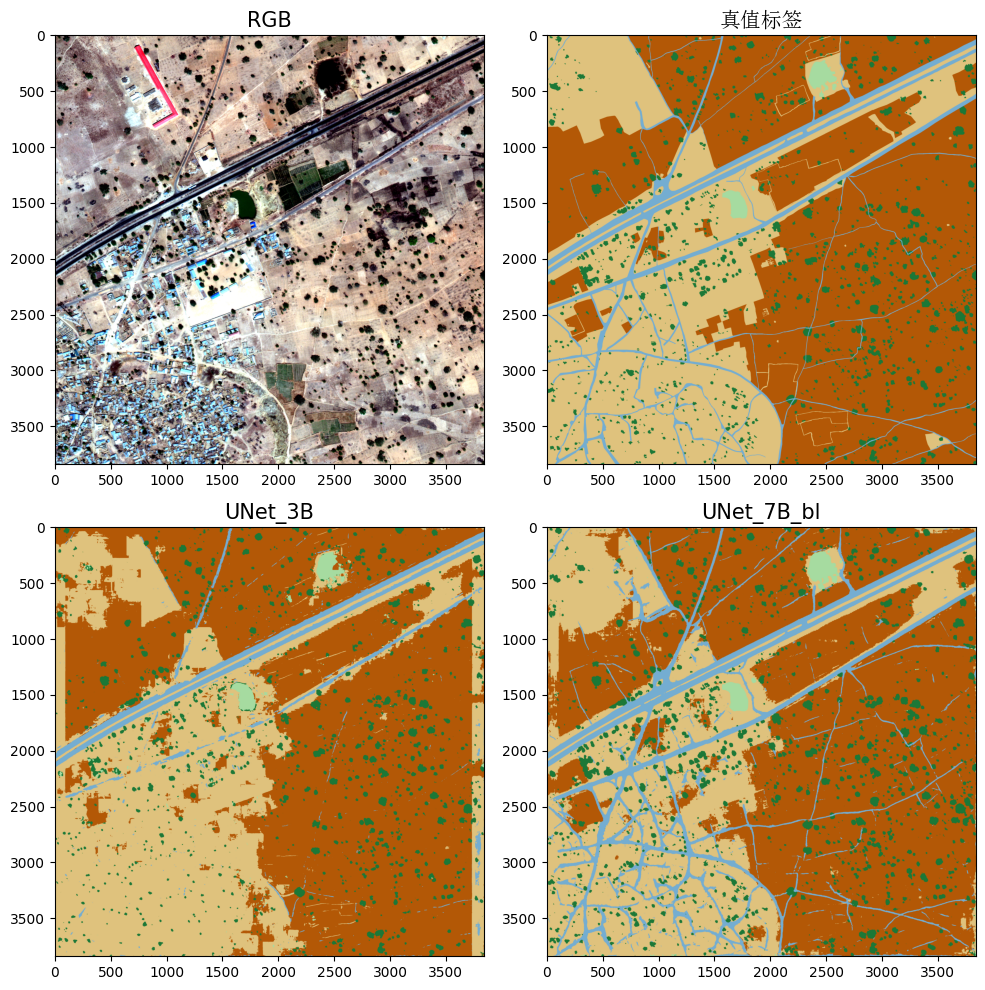

In [51]:
from matplotlib.font_manager import FontProperties
font_set = FontProperties(fname=r"c:\windows\fonts\simsun.ttc", size=15)

fig, axs = plt.subplots(2,2, figsize=(10,10))
axs[0,0].imshow(newimg[7,:,:,:3])
axs[0,1].imshow(gtc)
axs[1,0].imshow(result[0])
axs[1,1].imshow(result[4])
# axs[2,0].imshow(result[4])
# axs[2,1].imshow(gtc)
axs[0,0].set_title('RGB',fontsize=15)
axs[0,1].set_title('真值标签',font=font_set,fontsize=15)
axs[1,0].set_title('UNet_3B',fontsize=15)
axs[1,1].set_title('UNet_7B_bl',fontsize=15)
# axs[2,0].set_title('OUNet_7B_bl',fontsize=15)
# axs[2,1].set_title('Ground True',fontsize=15)

# fig.suptitle('Water Extraction Steps', fontsize=40)
for ax in fig.get_axes():
    # ax.label_outer()
    ax.grid(False)
    ax.ticklabel_format(style ='plain') 
fig.tight_layout()
# plt.subplots_adjust(left=None, bottom=None, right=None, top=0.9, wspace=None, hspace=0.2)

# fig.savefig(out_path+"T50TLK_20220825T030519_result.png",facecolor='white')

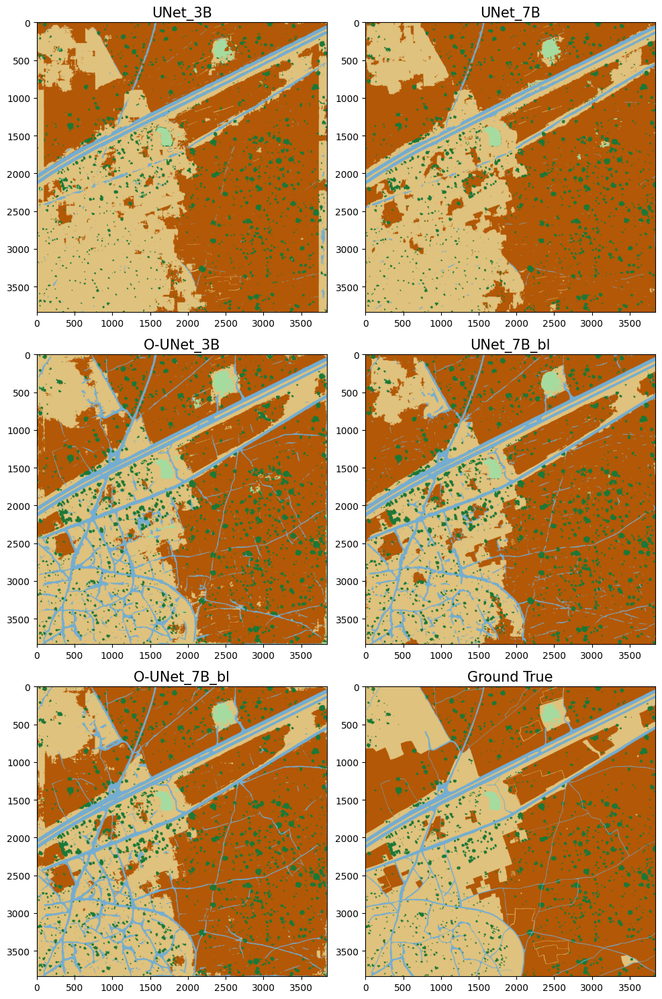

In [30]:
fig, axs = plt.subplots(3,2, figsize=(10,15))
axs[0,0].imshow(result[0])
axs[0,1].imshow(result[1])
axs[1,0].imshow(result[2])
axs[1,1].imshow(result[3])
axs[2,0].imshow(result[4])
axs[2,1].imshow(gtc)
axs[0,0].set_title('UNet_3B',fontsize=15)
axs[0,1].set_title('UNet_7B',fontsize=15)
axs[1,0].set_title('OUNet_3B',fontsize=15)
axs[1,1].set_title('UNet_7B_bl',fontsize=15)
axs[2,0].set_title('OUNet_7B_bl',fontsize=15)
axs[2,1].set_title('Ground True',fontsize=15)

# fig.suptitle('Water Extraction Steps', fontsize=40)
for ax in fig.get_axes():
    # ax.label_outer()
    ax.grid(False)
    ax.ticklabel_format(style ='plain') 
fig.tight_layout()
# plt.subplots_adjust(left=None, bottom=None, right=None, top=0.9, wspace=None, hspace=0.2)

# fig.savefig(out_path+"T50TLK_20220825T030519_result.png",facecolor='white')